## Breast Cancer Wisconsin Diagnosis using KNN 

In [18]:
import numpy as np 
import pandas as pd
  
# visualisation
import matplotlib.pyplot as plt
import seaborn as sns
# error test 
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report 
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

In [10]:
df = pd.read_csv("https://raw.githubusercontent.com/AmyrMa/INDE-577/main/data/data.csv")
df = df.drop(['id','Unnamed: 32'], axis = 1)
df['diagnosis'] = np.where(df.diagnosis.values == 'M', 1, 0)
y = df['diagnosis']
X = df.drop(['diagnosis'], axis=1).values

In [11]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


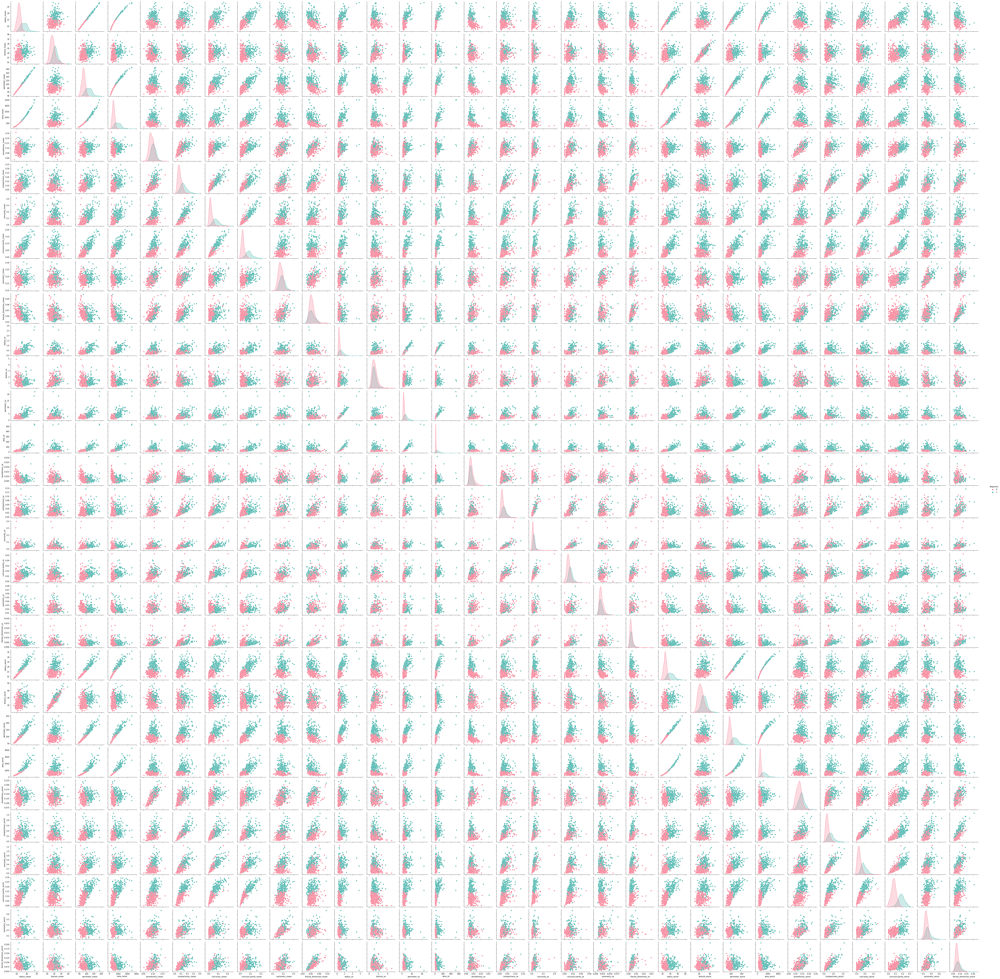

In [31]:
sns.pairplot(df, hue='diagnosis',palette='husl')

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42)

Since we have multiple features, and we cannot simply calculate the Euclidean distance. Thus we use sklearn package to implement the KNN

In [20]:
# perform cross validation to select the best number of neighbors
neighbors = []
cv_scores = []
for k in range(1, 51, 2):
    neighbors.append(k)
    knn = KNeighborsClassifier(n_neighbors = k)
    scores = cross_val_score(
        knn, X_train, y_train, cv = 10, scoring = 'accuracy')
    cv_scores.append(scores.mean())

The optimal number of neighbors is  13 


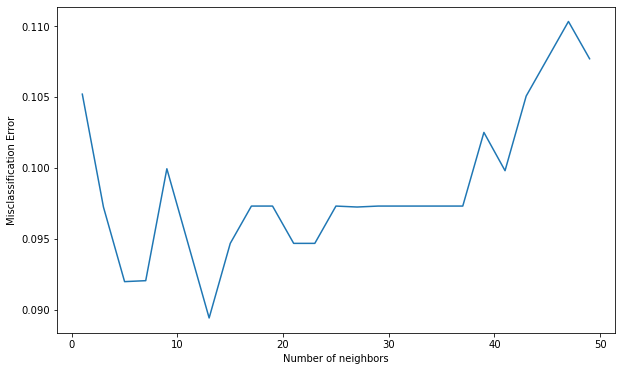

In [24]:
print('The optimal number of neighbors is % d ' % best_k)
  
# plot misclassification error versus k
plt.figure(figsize = (10, 6))
plt.plot(neighbors, MSE)
plt.xlabel('Number of neighbors')
plt.ylabel('Misclassification Error')
plt.show()

In [27]:
best_k = neighbors[cv_scores.index(max(cv_scores))]

13

In [28]:
best_model = KNeighborsClassifier(n_neighbors = 13)
best_model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=13)

In [30]:
best_model.score(X_test, y_test)

0.9627659574468085

The score for this model is 0.9627 which is very high,